In [1]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as  plt
import tensorflow as tf
from tensorflow.keras import layers,models,optimizers
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout,Flatten
from sklearn.metrics import accuracy_score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.applications import VGG16,VGG19
from tensorflow.keras.applications.efficientnet import EfficientNetB3
import warnings
warnings.simplefilter('ignore')
from PIL import Image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [2]:
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    # Set TensorFlow to use only the GPU devices
    tf.config.experimental.set_visible_devices(gpus, 'GPU')
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)  
print(gpus)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Load the Dataset

In [3]:
df = pd.read_csv(r"F:\ML Python VsCode\Leaf-Disease-Detection\train.csv")
df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [4]:
df['label'].value_counts()

label
3    13158
4     2577
2     2386
1     2189
0     1087
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

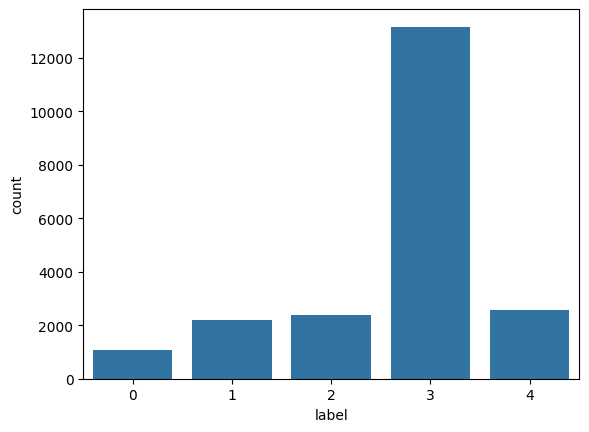

In [5]:
sns.countplot(df,x='label')

In [6]:
import json
with open(r"F:\ML Python VsCode\Leaf-Disease-Detection\label_num_to_disease_map.json") as file:
    print(json.dumps(json.loads(file.read()), indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


# EDA

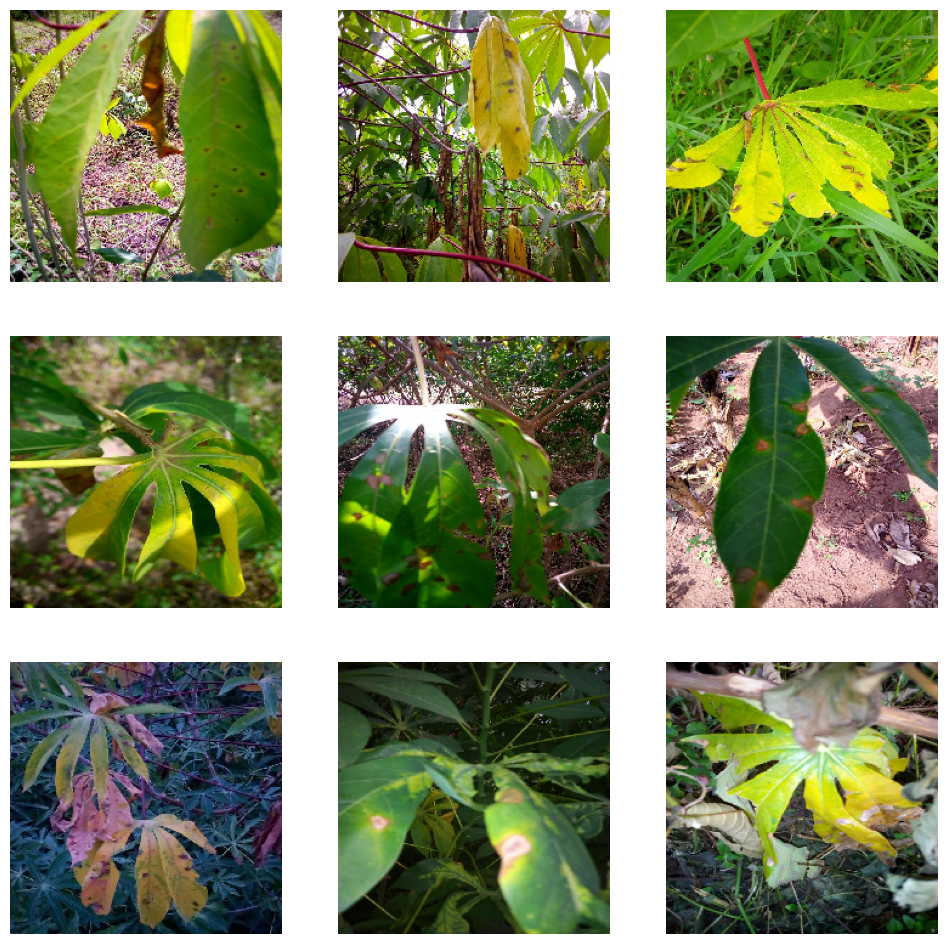

In [7]:
sample = df[df.label == 0].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join(r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

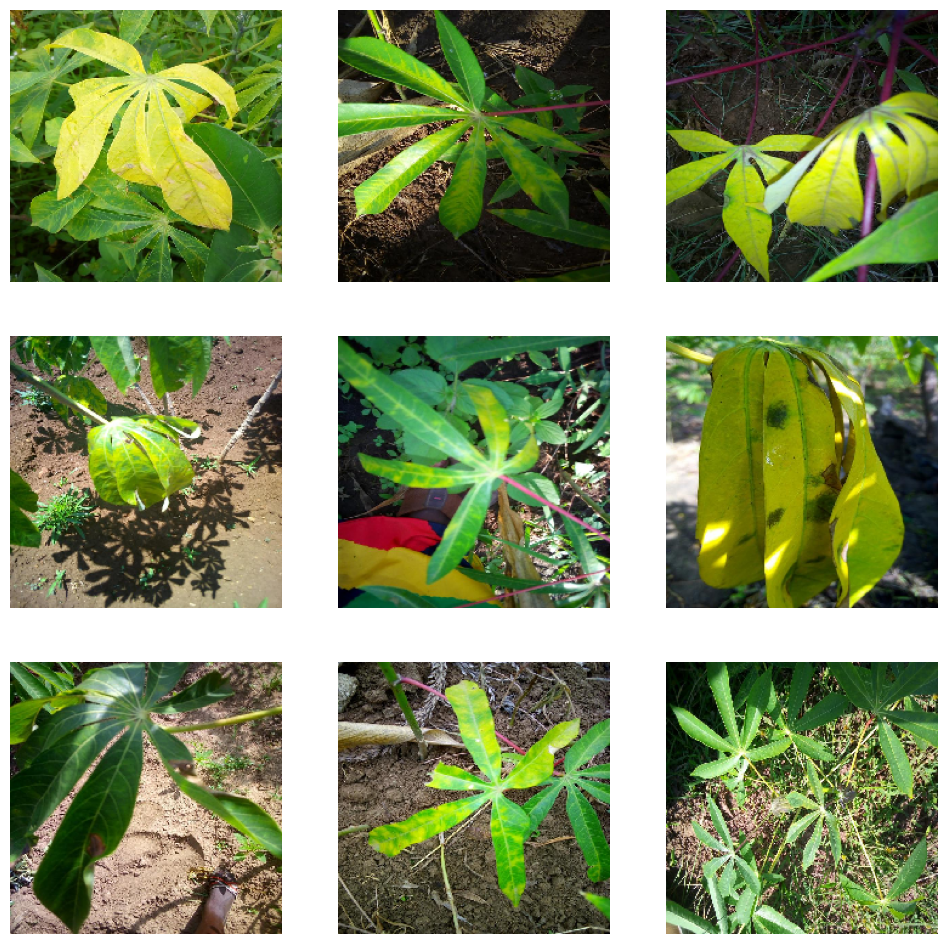

In [8]:
sample = df[df.label == 1].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join(r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

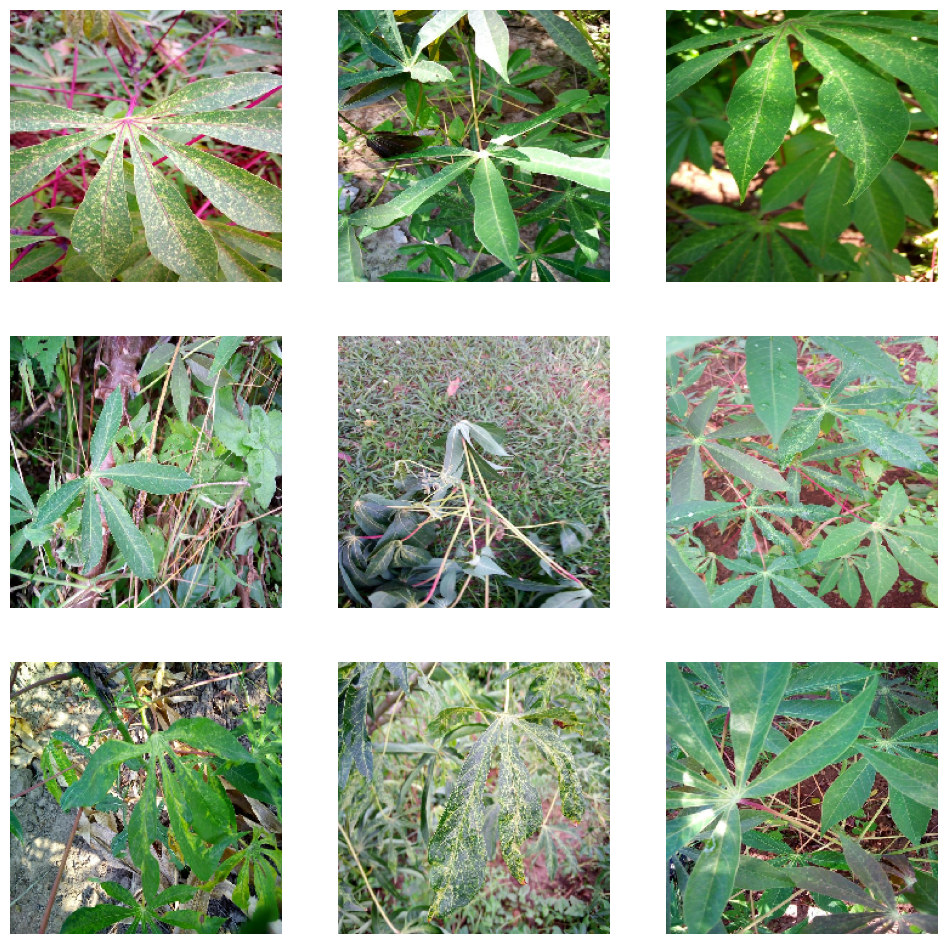

In [9]:
sample = df[df.label == 2].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join(r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

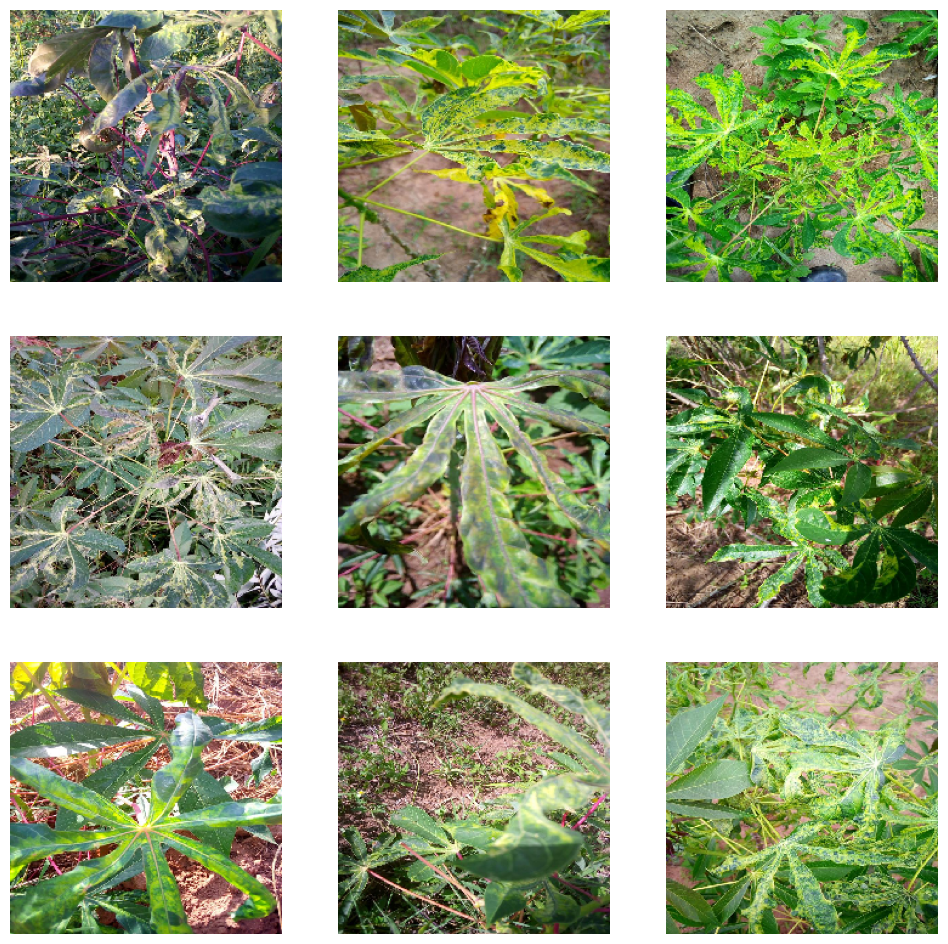

In [10]:
sample = df[df.label == 3].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join(r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

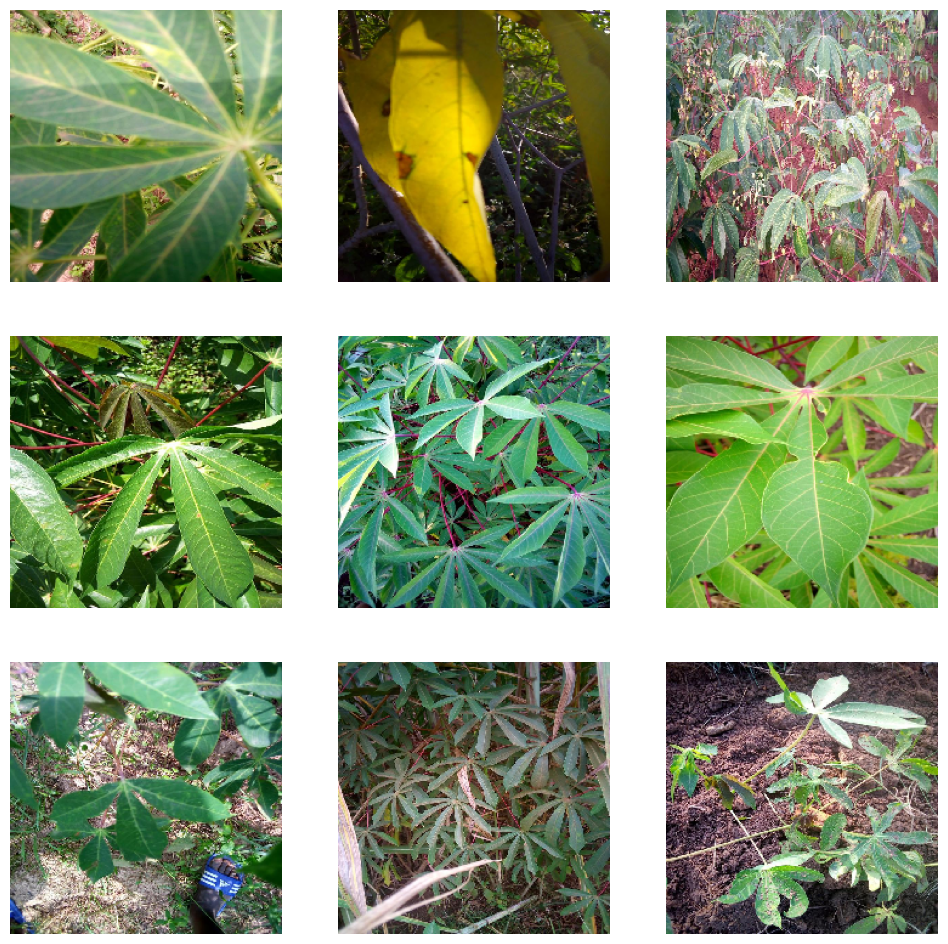

In [11]:
sample = df[df.label == 4].sample(9)
plt.figure(figsize=(12,12))

for ind, (image_id,label) in enumerate(zip(sample.image_id,sample.label)):
    plt.subplot(3,3,ind+1)
    image = load_img(os.path.join(r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",image_id),color_mode='rgb',target_size=(224,224))
    image = img_to_array(image)
    image = image/255.
    plt.imshow(image)
    plt.axis('off')
plt.show()

In [12]:
train_df = df.iloc[:20000,:]
test_df = df.iloc[20000:,:]

# Data Augumentation

In [13]:
train_df['label'] = train_df['label'].astype('str')
gen = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    shear_range = 0.2,
    zoom_range = 0.2,
    rescale = 1/255.,
)
train_datagen = gen.flow_from_dataframe(
    train_df,
    directory = r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",
    batch_size = 32,
    target_size = (224,224),
    seed = 42,
    x_col = 'image_id',
    y_col = 'label',
    class_mode = 'categorical'
)

Found 20000 validated image filenames belonging to 5 classes.


In [14]:
test_df['label'] = test_df['label'].astype('str')
gen = ImageDataGenerator(
    rescale = 1/255.,
)
test_datagen = gen.flow_from_dataframe(
    test_df,
    directory=r"F:\ML Python VsCode\Leaf-Disease-Detection\train_images",
    batch_size = 32,
    target_size = (224,224),
    seed = 42,
    x_col = 'image_id',
    y_col = 'label',
    class_mode = 'categorical'
)

Found 1397 validated image filenames belonging to 5 classes.


# Modelling

In [23]:
model = models.Sequential()
vgg = VGG19(include_top = False,weights = 'imagenet',input_shape=(224,224,3))
vgg.trainable = False
model.add(vgg)
model.add(GlobalAveragePooling2D())

model.add(Flatten())

model.add(Dense(256,activation='elu'))
model.add(Dropout(0.3))

model.add(Dense(5,activation='softmax'))

In [24]:
loss = tf.keras.losses.CategoricalCrossentropy(
    label_smoothing = 0.001,
    name = 'categorical_crossentropy'
)

In [17]:
optimizer = Adam(learning_rate = 1e-4)

In [25]:
model.compile(optimizer = optimizer,loss=loss,metrics= ['categorical_accuracy'])

In [26]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 5)                 1285      
                                                      

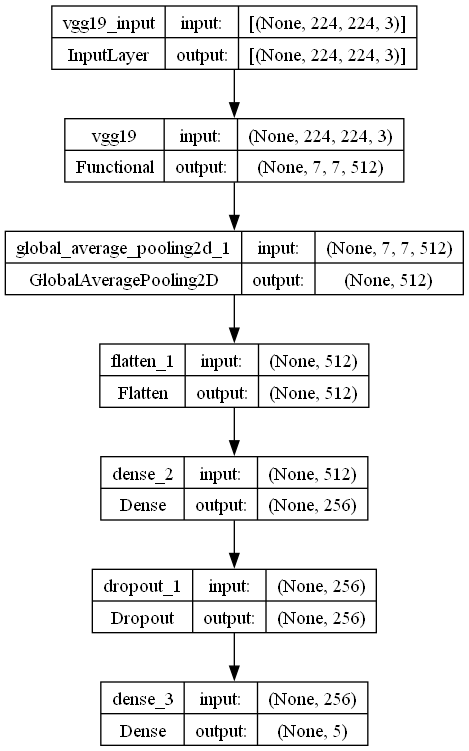

In [27]:
model.build((None))
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

# Train the model

In [28]:
rlrong = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    mode='min',
    min_lr = 1e-5,
    patience = 2,
    verbose=1
)
estop = EarlyStopping(
    monitor = 'val_loss',
    mode= 'min',
    patience = 3,
    verbose = 1,
    restore_best_weights = True
)

In [29]:
history = model.fit(train_datagen,epochs = 10,verbose=1,validation_data = test_datagen,callbacks = [rlrong,estop])

Epoch 1/10
625/625 [==============================] - 838s 1s/step - loss: 1.0764 - categorical_accuracy: 0.6288 - val_loss: 0.9548 - val_categorical_accuracy: 0.6650 - lr: 1.0000e-04
Epoch 2/10
625/625 [==============================] - 245s 391ms/step - loss: 0.9722 - categorical_accuracy: 0.6520 - val_loss: 0.9371 - val_categorical_accuracy: 0.6764 - lr: 1.0000e-04
Epoch 3/10
625/625 [==============================] - 736s 1s/step - loss: 0.9412 - categorical_accuracy: 0.6619 - val_loss: 0.8935 - val_categorical_accuracy: 0.6872 - lr: 1.0000e-04
Epoch 4/10
625/625 [==============================] - 439s 702ms/step - loss: 0.9184 - categorical_accuracy: 0.6674 - val_loss: 0.8823 - val_categorical_accuracy: 0.6822 - lr: 1.0000e-04
Epoch 5/10
625/625 [==============================] - 361s 577ms/step - loss: 0.9002 - categorical_accuracy: 0.6743 - val_loss: 0.8606 - val_categorical_accuracy: 0.6965 - lr: 1.0000e-04
Epoch 6/10
625/625 [==============================] - 249s 398ms/step -

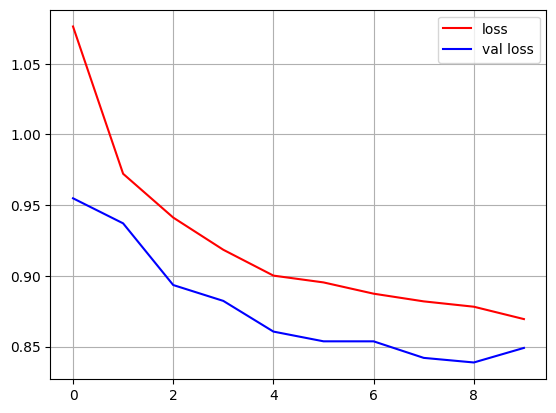

In [32]:
plt.plot(history.history['loss'],label='loss',color='red')
plt.plot(history.history['val_loss'],label='val loss',color='blue')
plt.legend()
plt.grid()
plt.show()

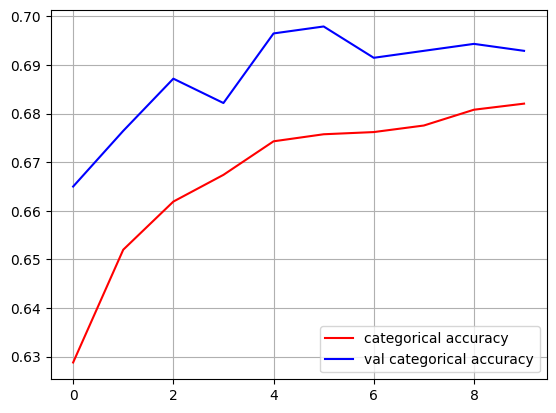

In [33]:
plt.plot(history.history['categorical_accuracy'],label='categorical accuracy',color='red')
plt.plot(history.history['val_categorical_accuracy'],label='val categorical accuracy',color='blue')
plt.legend()
plt.grid()
plt.show()

In [34]:
model.save('model.h5')